# Manna model

The Manna model is similar in concept to the BTW model. However, where BTW dissipates its "sand grains" deterministically, the Manna model introduces some **randomness**. Let's take a look:

In [1]:
cd ..

/aktualne/git_repozytoria/git_SOC/SocSIM


In [3]:
from SOC import Manna
model = Manna(L=3, save_every=1)
model.critical_value

1

This means that the model begins toppling its "sandpiles" once we put two grains somewhere. Let's try that:

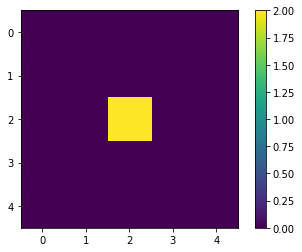

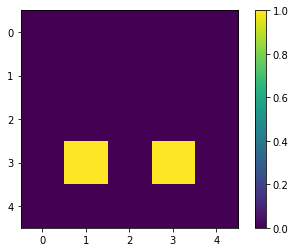

In [20]:
model = Manna(L=3, save_every=1)
model.values[2,2] = 2
model.plot_state(with_boundaries=True);
model.AvalancheLoop()
model.plot_state(with_boundaries=True);

Why these two target locations in particular? It actually is random! Let's rerun that:

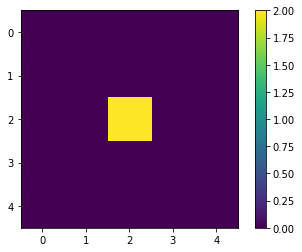

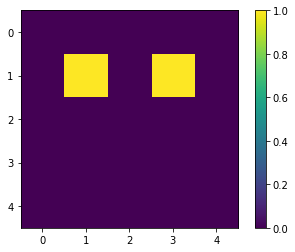

In [21]:
model = Manna(L=3, save_every=1)
model.values[2,2] = 2
model.plot_state(with_boundaries=True);
model.AvalancheLoop()
model.plot_state(with_boundaries=True);

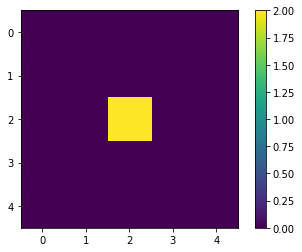

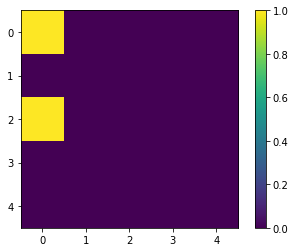

In [22]:
model = Manna(L=3, save_every=1)
model.values[2,2] = 2
model.plot_state(with_boundaries=True);
model.AvalancheLoop()
model.plot_state(with_boundaries=True);

Oh, that's a bit weird, isn't it? These seem to have moved awfully far. The trick is that the two grains that fall from the toppling location pick their location at random **independently**, and here they both picked (1, 1) at first.

Let's run it for some more time:

In [25]:
model = Manna(L=5, save_every=1)
model.run(1000)
model.animate_states(notebook=True)

Waiting for wait_for_n_iters=10 iterations before collecting data. This should let the system thermalize.


Let's run a larger simulation instead:

In [37]:
model = Manna(L=10, save_every=1)
model.run(1000)
model.animate_states(notebook=True)

Waiting for wait_for_n_iters=10 iterations before collecting data. This should let the system thermalize.


If you look closely, you'll see that the system begins to exhibit very large avalanches very soon:

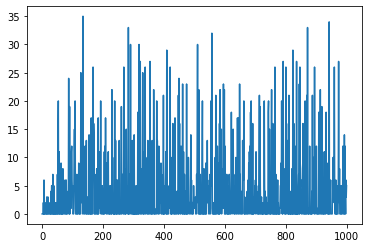

In [38]:
model.data_df.AvalancheSize.plot()

Let's take a look at how modifying the critical value affects the simulation. We'll do some more iterations, so the system has the opportunity to "fill up" better. We'll also skip some animation frames.

In [47]:
model = Manna(L=10, critical_value=4, save_every=10)
model.run(5000, wait_for_n_iters = 1000)
model.animate_states(notebook=True)

Waiting for wait_for_n_iters=1000 iterations before collecting data. This should let the system thermalize.


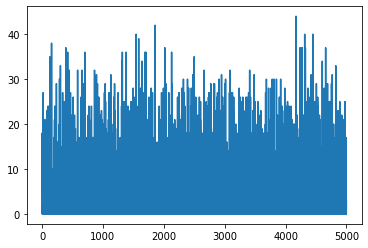

In [48]:
model.data_df.AvalancheSize.plot()

Note how the avalanche size grows until a certain period, and then starts to fluctuate randomly at pretty large values. We can try to investigate the histogram of those avalanche sizes. We'll also fit a line to the linear segment (picked purely subjectively, visually and heuristically).

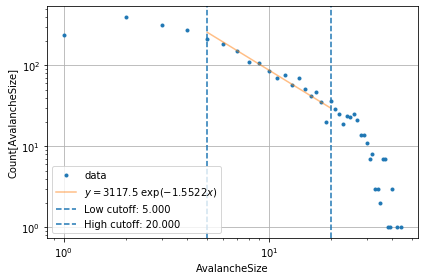

y = 3117.481 exp(-1.5522 x)


{'exponent': -1.552219845297347, 'intercept': 3.4938038036304393}

In [53]:
model.get_exponent(low=5, high=20)

One thing for sure, there is a region where the scaling in log-log scale is linear. The line fits rather well.

Let's run a larger simulation and try to estimate the scaling exponent. We'll wait for a good while so that the system can thermalize well:

In [61]:
model = Manna(L=40, save_every=100)
model.run(100000, wait_for_n_iters=50000)

Waiting for wait_for_n_iters=50000 iterations before collecting data. This should let the system thermalize.


In [62]:
model.animate_states(notebook=True)

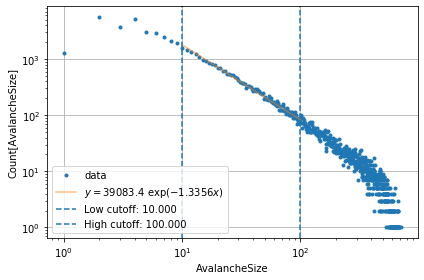

y = 39083.385 exp(-1.3356 x)


{'exponent': -1.3356064470598588, 'intercept': 4.591992174363189}

In [63]:
model.get_exponent(low = 10, high=100)

Let's see how reproducible this is:

Waiting for wait_for_n_iters=50000 iterations before collecting data. This should let the system thermalize.


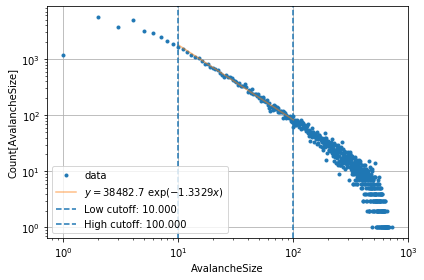

y = 38482.710 exp(-1.3329 x)


{'exponent': -1.3328829112845815, 'intercept': 4.585265642606212}

In [65]:
model = Manna(L=40, save_every=10000)
model.run(100000, wait_for_n_iters=50000)
model.get_exponent(low = 10, high=100)

Waiting for wait_for_n_iters=50000 iterations before collecting data. This should let the system thermalize.


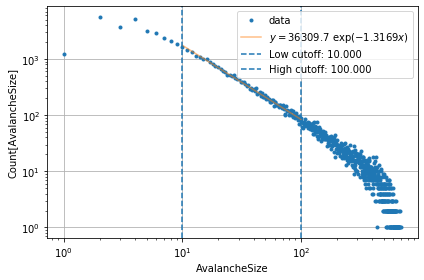

y = 36309.665 exp(-1.3169 x)


{'exponent': -1.316892681945754, 'intercept': 4.5600222427865065}

In [66]:
model = Manna(L=40, save_every=10000)
model.run(100000, wait_for_n_iters=50000)
model.get_exponent(low = 10, high=100)

Waiting for wait_for_n_iters=50000 iterations before collecting data. This should let the system thermalize.


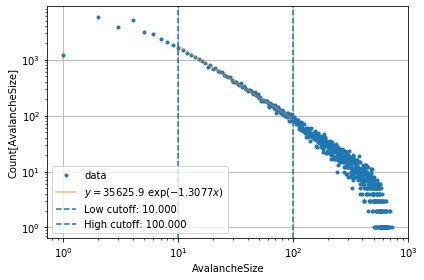

y = 35625.884 exp(-1.3077 x)


{'exponent': -1.3077133473189786, 'intercept': 4.551765652488615}

In [67]:
model = Manna(L=40, save_every=10000)
model.run(100000, wait_for_n_iters=50000)
model.get_exponent(low = 10, high=100)

And the exponent for this model was reported by others (see Table 6.1 in [Pruessner](https://doi.org/10.1017/CBO9780511977671)) to be around 1.25-1.30.

Which is pretty darn close!

There is another quantity we could calculate here, the number of iterations for an avalanche to finish:

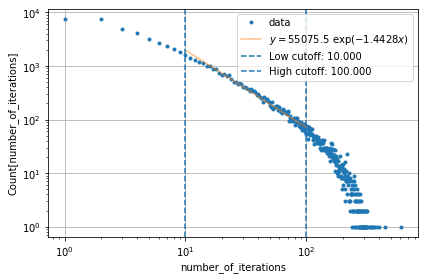

y = 55075.511 exp(-1.4428 x)


{'exponent': -1.4428414522987587, 'intercept': 4.7409585345785565}

In [68]:
model.get_exponent("number_of_iterations", low = 10, high=100)